# PXP Model Riemannian Optimisation

In [1]:
import jax
import jax.numpy as jnp

jax.config.update("jax_enable_x64", True)

method = 'Le'
system = 'pxp'

In [2]:
# Build first order Trotterised PXP model from Julian's code
from mpo_lib.models.pxp_model import PXPModel1D
from mpo_lib.circuit.brickwall import BrickwallCircuit

num_sites = 45
num_steps = 7
final_time = 0.3

model_first_order = PXPModel1D.first_order(num_sites, final_time, num_steps)
# model_first_order.combine_layers()

In [3]:
# from ropt_aqc.pxp_model import test_magnetisation_evolution

# time_steps=10
# binary = '101010101010101010100101001010101010101010101'
# # binary = '10101010100101010101'
# # binary = '100101'

# state_quimb = test_magnetisation_evolution(binary, num_sites, num_steps, time_steps)

In [4]:
# from ropt_aqc.pxp_model import test_magnetisation_evolution

# time_steps=10
# binary_vac = '101010101010101010101010101010101010101010101'
# # binary = '10101010100101010101'
# # binary = '100101'

# state_quimb_vac = test_magnetisation_evolution(binary_vac, num_sites, num_steps, time_steps)

In [5]:
# import matplotlib.pyplot as plt
# import numpy as np

# mag_diff = state_quimb - state_quimb_vac

# occupation_diff = np.zeros((time_steps, num_sites-1))
# for i in range(num_sites-1):
#     occupation_diff[:, i] = (-1)**i * 0.5 * (mag_diff[:, i] + mag_diff[:, i+1])

# plt.figure(figsize=(6.4, 4.8))
# plt.pcolor(
#     np.arange(occupation_diff.shape[1]),
#     np.arange(time_steps),
#     occupation_diff,
#     cmap='bwr', vmin=-1.0, vmax=1.0, shading='nearest'
# )
# plt.colorbar(label='Δ Occupation (particles - vacuum)')
# plt.xlabel("Site index")
# plt.ylabel("Time step")
# plt.title("Occupation difference: particles vs. vacuum")
# plt.show()


gates for riemannian optimisation, maybe try and build them better

In [6]:
from ropt_aqc.circuit_building import transform_layered_gates_to_qc_with_names
from ropt_aqc.pxp_model import name_layered_gates, merge_single_qubit_gates, remap_layered_gate_indices
flat_gates = BrickwallCircuit.to_gate_list(model_first_order)
layered_gates = BrickwallCircuit.to_layered_gate_list(model_first_order)

layered_gates_remapped = remap_layered_gate_indices(layered_gates, num_sites)
remapped_circuit = transform_layered_gates_to_qc_with_names(num_sites, layered_gates_remapped)

merged_layers = merge_single_qubit_gates(layered_gates_remapped, with_names=True, use_TN=False)

remapped_circuit_merged = transform_layered_gates_to_qc_with_names(num_sites, merged_layers)
# remapped_circuit_merged.draw('mpl')

In [7]:
# remapped_circuit.draw('mpl')

In [8]:
from qiskit import transpile

transpiled_circuit = transpile(remapped_circuit, basis_gates=['cx', 'rz', 'sx'], optimization_level=3)
# transpiled_circuit.draw('mpl')

In [9]:
original_depth = remapped_circuit_merged.depth()
print(original_depth)

56


In [10]:
def count_two_qubit_layers(circuit):
    layers = []
    
    for inst in circuit.data:
        if len(inst.qubits) != 2:
            continue  # skip 1Q gates

        q0 = circuit.find_bit(inst.qubits[0]).index
        q1 = circuit.find_bit(inst.qubits[1]).index

        # Try to place this 2Q gate into an existing non-overlapping layer
        placed = False
        for layer in layers:
            if q0 not in layer and q1 not in layer:
                layer.add(q0)
                layer.add(q1)
                placed = True
                break
        if not placed:
            # Start a new layer with this gate
            layers.append(set([q0, q1]))
    
    return len(layers)
n_layers = count_two_qubit_layers(transpiled_circuit)
print(f"Number of 2-qubit layers: {n_layers}")

Number of 2-qubit layers: 56


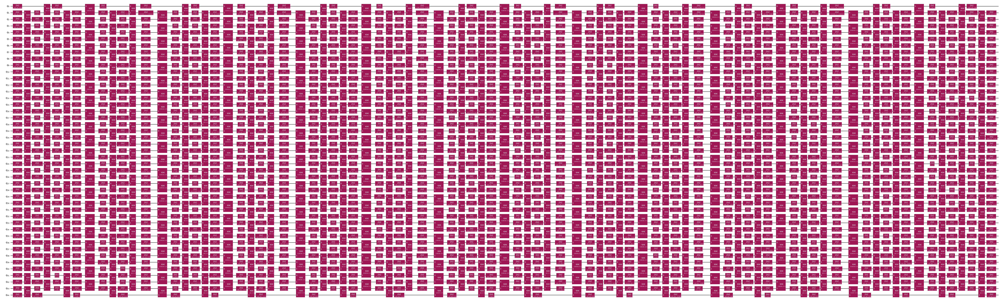

In [11]:
# generate ansatz from circuit
from qiskit_addon_aqc_tensor import generate_ansatz_from_circuit

aqc_ansatz, aqc_initial_parameters = generate_ansatz_from_circuit(
    remapped_circuit_merged, parameter_name="x"
)
aqc_ansatz_original = aqc_ansatz.assign_parameters(aqc_initial_parameters)
aqc_ansatz_original.draw("mpl", fold=-1)
# aqc_ansatz_original.draw("mpl").savefig('Figures/initial_circuit_AQC-u_PXP_1step.pdf')

In [12]:
from qiskit import transpile

transpiled_circuit_aqc = transpile(aqc_ansatz_original, basis_gates=['cx', 'rz', 'sx'], optimization_level=3)
# transpiled_circuit_aqc.draw('mpl')

In [13]:
print(transpiled_circuit.depth())
print(transpiled_circuit_aqc.depth())

297
260


In [14]:
def count_su4_layers(circuit):
    layers = []
    
    for inst in circuit.data:
        # Only consider 2-qubit gates that are not named like cx, swap, etc.
        if len(inst.qubits) != 2:
            continue
        if inst.operation.name in ['cx', 'cz', 'swap']:
            continue

        q0 = circuit.find_bit(inst.qubits[0]).index
        q1 = circuit.find_bit(inst.qubits[1]).index

        # Try to place this gate into an existing layer where it doesn't overlap
        placed = False
        for layer in layers:
            if q0 not in layer and q1 not in layer:
                layer.add(q0)
                layer.add(q1)
                placed = True
                break
        if not placed:
            # Create new layer
            layers.append(set([q0, q1]))

    return len(layers)
su4_layer_count = count_su4_layers(remapped_circuit)
print(f"Number of SU(4)-like layers: {su4_layer_count}")


Number of SU(4)-like layers: 56


In [15]:
# from ropt_aqc.pxp_model import test_magnetisation_qiskit

# state_qiskit = test_magnetisation_qiskit(num_sites, binary, time_steps, qc=remapped_circuit_merged)

In [16]:
# time_steps=30
# binary_vac = '101010101010101010101010101010101010101010101'
# # binary = '10101010100101010101'
# # binary = '100101'

# state_qiskit_vac = test_magnetisation_qiskit(num_sites, binary_vac, time_steps, qc=remapped_circuit_merged)

In [17]:
# mag_diff = state_qiskit - state_qiskit_vac

# occupation_diff = np.zeros((time_steps, num_sites-1))
# for i in range(num_sites-1):
#     occupation_diff[:, i] = (-1)**i * 0.5 * (mag_diff[:, i] + mag_diff[:, i+1])

# plt.figure(figsize=(6.4, 4.8))
# plt.pcolor(
#     np.arange(occupation_diff.shape[1]),
#     np.arange(time_steps),
#     occupation_diff,
#     cmap='bwr', vmin=-1.0, vmax=1.0, shading='nearest'
# )
# plt.colorbar(label='Δ Occupation Qiskit (particles - vacuum)')
# plt.xlabel("Site index")
# plt.ylabel("Time step")
# plt.title("Occupation difference: particles vs. vacuum")
# plt.show()


In [18]:
depth = remapped_circuit_merged.depth()
print(depth)

56


In [19]:
# TN gates for Riemannian optimisaiton
import numpy as np
from ropt_aqc.brickwall_circuit import get_initial_gates

gates_initial = get_initial_gates(n_sites=num_sites, t=final_time, n_repetitions=num_steps, degree=1, hamiltonian=system, n_id_layers=0, use_TN=False)
print(np.array(gates_initial).shape) 
gates = get_initial_gates(n_sites=num_sites, t=final_time, n_repetitions=num_steps, degree=1, hamiltonian=system, n_id_layers=0, use_TN=True)

print(gates.shape)
print(gates)

(1232, 4, 4)
(1232, 2, 2, 2, 2)
[[[[[ 9.99942603e-01+0.j          0.00000000e+00-0.01071408j]
    [ 0.00000000e+00+0.j          0.00000000e+00+0.j        ]]

   [[ 0.00000000e+00-0.01071408j  9.99942603e-01+0.j        ]
    [ 0.00000000e+00+0.j          0.00000000e+00+0.j        ]]]


  [[[ 0.00000000e+00+0.j          0.00000000e+00+0.j        ]
    [ 9.99942603e-01+0.j          0.00000000e+00+0.01071408j]]

   [[ 0.00000000e+00+0.j          0.00000000e+00+0.j        ]
    [ 0.00000000e+00-0.01071408j -9.99942603e-01+0.j        ]]]]



 [[[[ 9.99985651e-01+0.j          0.00000000e+00-0.00535712j]
    [ 0.00000000e+00+0.j          0.00000000e+00+0.j        ]]

   [[ 0.00000000e+00-0.00535712j  9.99985651e-01+0.j        ]
    [ 0.00000000e+00+0.j          0.00000000e+00+0.j        ]]]


  [[[ 0.00000000e+00+0.j          0.00000000e+00+0.j        ]
    [ 9.99985651e-01+0.j          0.00000000e+00+0.00535712j]]

   [[ 0.00000000e+00+0.j          0.00000000e+00+0.j        ]
    [ 0.00000000

In [20]:
from ropt_aqc.brickwall_circuit import get_gates_per_layer
import jax.numpy as jnp
from itertools import chain

N = depth

gates_per_layer, gate_sites_per_layer, layer_is_odd = get_gates_per_layer(
    gates, n_sites=num_sites, degree=1, n_repetitions=num_steps, hamiltonian=system
)

for i, (layer, sites) in enumerate(zip(gates_per_layer[:N], gate_sites_per_layer[:N])):
    print(f"Layer {i} ({'odd' if layer_is_odd[i] else 'even'}), #gates: {len(layer)}, sites: {sites}")
gates_layer_structure = [len(layer) for layer in gates_per_layer[:N]]

gates_subset = gates_per_layer[:N]
layer_is_odd_subset = layer_is_odd[:N]
gates_subset = list(chain(*gates_per_layer[:N]))
gates_subset = jnp.asarray(gates_subset)
print(np.array(gates_subset).shape)


Layer 0 (odd), #gates: 22, sites: [(0, 1), (2, 3), (4, 5), (6, 7), (8, 9), (10, 11), (12, 13), (14, 15), (16, 17), (18, 19), (20, 21), (22, 23), (24, 25), (26, 27), (28, 29), (30, 31), (32, 33), (34, 35), (36, 37), (38, 39), (40, 41), (42, 43)]
Layer 1 (even), #gates: 22, sites: [(1, 2), (3, 4), (5, 6), (7, 8), (9, 10), (11, 12), (13, 14), (15, 16), (17, 18), (19, 20), (21, 22), (23, 24), (25, 26), (27, 28), (29, 30), (31, 32), (33, 34), (35, 36), (37, 38), (39, 40), (41, 42), (43, 44)]
Layer 2 (odd), #gates: 22, sites: [(0, 1), (2, 3), (4, 5), (6, 7), (8, 9), (10, 11), (12, 13), (14, 15), (16, 17), (18, 19), (20, 21), (22, 23), (24, 25), (26, 27), (28, 29), (30, 31), (32, 33), (34, 35), (36, 37), (38, 39), (40, 41), (42, 43)]
Layer 3 (even), #gates: 22, sites: [(1, 2), (3, 4), (5, 6), (7, 8), (9, 10), (11, 12), (13, 14), (15, 16), (17, 18), (19, 20), (21, 22), (23, 24), (25, 26), (27, 28), (29, 30), (31, 32), (33, 34), (35, 36), (37, 38), (39, 40), (41, 42), (43, 44)]
Layer 4 (even), 

In [21]:
# from ropt_aqc.pxp_model import get_brickwall_trotter_gates_spin_chain_pxp

# gates_clean_flat = get_brickwall_trotter_gates_spin_chain_pxp(final_time, num_sites, num_steps, return_format='flat', use_TN=False)
# print(np.array(gates_clean_flat).shape) 

# gates_clean_flat_2 = get_brickwall_trotter_gates_spin_chain_pxp(final_time, num_sites, num_steps, return_format='flat', use_TN=True)
# print(gates_clean_flat_2.shape)

In [22]:
# from ropt_aqc.circuit_building import transform_to_bw_qc_unitarygate

# qc_initial = transform_to_bw_qc_unitarygate(num_sites=num_sites, n_repetitions=num_steps, system=system, gates=gates_clean_flat)
# qc_initial.draw('mpl')

In [23]:
# from ropt_aqc.pxp_model import test_magnetisation_qiskit

# state_qiskit = test_magnetisation_qiskit(num_sites, binary, time_steps, qc=qc_initial)

In [29]:
from ropt_aqc.save_model import load_reference
import os
import yaml
repo_root = "/Users/aag/Documents/ropt-aqc/"
config_file = os.path.join(repo_root, "run", system, "configs", "config.yml") 

with open(config_file, "r") as f:
    config = yaml.safe_load(f)

config['reference_dir'] = f'/Users/aag/Documents/ropt-aqc/run/{system}/reference'

U_ref, t, _, _, _, _, _, _, _ = load_reference(config['reference_dir'], config['n_sites'], config['n_repetitions'], config['t'])
print(U_ref)

[Array([[[[-0.51747025-0.48121418j, -0.00445734+0.02633797j],
         [-0.00595454+0.02493989j, -0.7035461 -0.06564553j]],

        [[-0.00910598+0.02396948j, -0.70615298+0.02518749j],
         [-0.69852811+0.10677556j,  0.00293946+0.02655026j]]]],      dtype=complex128), Array([[[[-7.06176390e-01+9.03242967e-23j,
          -2.67830663e-02+8.87923966e-18j],
         [ 9.65428050e-03+2.37469920e-02j,
          -6.53713894e-02-7.03548675e-01j]],

        [[ 1.26181934e-02+2.23138064e-02j,
          -1.55002590e-01-6.89368082e-01j],
         [-4.38526648e-01+5.53515559e-01j,
          -2.54750212e-02+8.26777760e-03j]]],


       [[[-6.83144028e-03+2.47199274e-02j,
          -1.86338039e-04+2.95198848e-04j],
         [ 1.48314213e-04+1.24025566e-04j,
          -2.92457211e-03-4.45380362e-03j]],

        [[-9.49892345e-05+1.68393829e-04j,
           3.84904120e-03-3.68434352e-03j],
         [-1.51172971e-02-2.07174013e-02j,
          -1.15374545e-04-3.29505594e-04j]]]], dtype=complex128), 

In [30]:
from ropt_aqc.tn_helpers import left_to_right_QR_sweep

U_ref = left_to_right_QR_sweep(U_ref, get_norm=False, normalize=config['normalize_reference'])
print("U_ref shape:", [m.shape for m in U_ref])
print(U_ref)

U_ref shape: [(1, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 2), (2, 2, 2, 1)]
[Array([[[[-0.51747025-0.48121418j, -0.00445734+0.02633797j],
         [-0.00595454+0.02493989j, -0.7035461 -0.06564553j]],

        [[-0.00910598+0.02396948j, -0.70615298+0.02518749j],
         [-0.69852811+0.10677556j,  0.00293946+0.02655026j]]]],      dtype=complex128), Array([[[[-7.06176390e-01-5.46016204e-19j,
          -2.67830663e-02+5.91091727e-1

In [31]:
# Plot optimisation landscape
# import matplotlib.pyplot as plt
# import numpy as np
# from ropt_aqc.tn_brickwall_methods import get_riemannian_gradient_and_cost_function

# ϵ = 1e-2
# num_pts = 40
# eps_range = np.linspace(-ϵ, ϵ, num_pts)
# cost_surface = np.zeros((num_pts, num_pts))

# for i, α in enumerate(eps_range):
#     for j, β in enumerate(eps_range):
#         V_pert = gates.copy()
#         V_pert[0, 0, 0, 0] += α
#         V_pert[1, 0, 0, 0] += β
#         cost, _ = get_riemannian_gradient_and_cost_function(
#             U_ref, V_pert, num_sites, 1, num_steps, 0, 4096,
#             reference_is_normalized=False, hamiltonian=system
#         )
#         cost_surface[i, j] = cost

# # Plot
# plt.figure(figsize=(6, 5))
# plt.contourf(eps_range, eps_range, cost_surface, levels=30, cmap='viridis')
# plt.colorbar(label='Cost')
# plt.xlabel('α (perturbation on V[0,0,0,0])')
# plt.ylabel('β (perturbation on V[1,0,0,0])')
# plt.title('Cost Landscape around Initial Gates')
# plt.tight_layout()
# plt.show()


In [32]:
# # Plot cost funciton
# from ropt_aqc.tn_brickwall_methods import get_riemannian_gradient_and_cost_function
# import matplotlib.pyplot as plt

# vals = []
# eps_range = np.linspace(-1e-2, 1e-2, 100)
# for eps in eps_range:
#     V_pert = gates.copy()
#     V_pert[0, 0, 0] += eps
#     cost, _ = get_riemannian_gradient_and_cost_function(U_ref, V_pert, num_sites, 1, num_steps, 0, 4096, reference_is_normalized=False, hamiltonian=system)
#     vals.append(cost)

# plt.plot(eps_range, vals)
# plt.xlabel("Epsilon")
# plt.ylabel("Cost")
# plt.title("Cost vs Perturb
# ation on Vlist[0,0,0]")
# plt.grid(True)
# plt.show()


In [33]:
from ropt_aqc.brickwall_opt import optimize_swap_network_circuit_RieADAM

gates_optimised, err_iter = optimize_swap_network_circuit_RieADAM(config, U_ref, gates)

Start Riemannian ADAM optimization ...
	 0 	Current cost:  2.011290953877604
	 5 	Current cost:  2.0383557205582905
	 10 	Current cost:  2.0877227188689287
	 15 	Current cost:  2.1953202953807827
	 20 	Current cost:  2.394484401838934


KeyboardInterrupt: 

In [ ]:
import pickle

with open(f"optimized_gates_{num_steps}steps_{final_time}t.pkl", "wb") as f:
    pickle.dump((gates_optimised, err_iter), f)


In [ ]:
import pickle
with open(f"optimized_gates_{num_steps}steps_{final_time}t.pkl", "rb") as f:
    gates_optimised, err_iter = pickle.load(f)


In [ ]:
from ropt_aqc.brickwall_circuit import get_gates_per_layer
import jax.numpy as jnp
from itertools import chain

N = depth

gates_per_layer, gate_sites_per_layer, layer_is_odd = get_gates_per_layer(
    gates, n_sites=num_sites, degree=1, n_repetitions=num_steps, hamiltonian=system
)

for i, (layer, sites) in enumerate(zip(gates_per_layer[:N], gate_sites_per_layer[:N])):
    print(f"Layer {i} ({'odd' if layer_is_odd[i] else 'even'}), #gates: {len(layer)}, sites: {sites}")
gates_layer_structure = [len(layer) for layer in gates_per_layer[:N]]

gates_subset = gates_per_layer[:N]
layer_is_odd_subset = layer_is_odd[:N]
gates_subset = list(chain(*gates_per_layer[:N]))
gates_subset = jnp.asarray(gates_subset)
print(np.array(gates_subset).shape)


Layer 0 (odd), #gates: 22, sites: [(0, 1), (2, 3), (4, 5), (6, 7), (8, 9), (10, 11), (12, 13), (14, 15), (16, 17), (18, 19), (20, 21), (22, 23), (24, 25), (26, 27), (28, 29), (30, 31), (32, 33), (34, 35), (36, 37), (38, 39), (40, 41), (42, 43)]
Layer 1 (even), #gates: 22, sites: [(1, 2), (3, 4), (5, 6), (7, 8), (9, 10), (11, 12), (13, 14), (15, 16), (17, 18), (19, 20), (21, 22), (23, 24), (25, 26), (27, 28), (29, 30), (31, 32), (33, 34), (35, 36), (37, 38), (39, 40), (41, 42), (43, 44)]
Layer 2 (odd), #gates: 22, sites: [(0, 1), (2, 3), (4, 5), (6, 7), (8, 9), (10, 11), (12, 13), (14, 15), (16, 17), (18, 19), (20, 21), (22, 23), (24, 25), (26, 27), (28, 29), (30, 31), (32, 33), (34, 35), (36, 37), (38, 39), (40, 41), (42, 43)]
Layer 3 (even), #gates: 22, sites: [(1, 2), (3, 4), (5, 6), (7, 8), (9, 10), (11, 12), (13, 14), (15, 16), (17, 18), (19, 20), (21, 22), (23, 24), (25, 26), (27, 28), (29, 30), (31, 32), (33, 34), (35, 36), (37, 38), (39, 40), (41, 42), (43, 44)]
Layer 4 (even), 

In [ ]:
# from ropt_aqc.comparison_methods import compress_HS

# N_vals = range(1, original_depth+1)
# df, gates_optimised = compress_HS(gates, config, U_ref, N_vals, remapped_circuit_merged)

In [ ]:
# import pandas as pd
# file_path_PXP = f'/Users/aag/Documents/ropt-aqc/PXP/results/Le_PXP_results_{num_steps}_{final_time}.csv'
# # file_path_ising = '/Users/aag/Documents/ropt-aqc/method_comparison/Le_Ising_results_1000.csv'

# df.to_csv(file_path_PXP, index=False, header=True)
# # df.to_csv(file_path_PXP, index=False, mode="a", header=False)

In [ ]:
# import matplotlib.pyplot as plt
# # df = pd.read_csv(file_path_ising)
# # Plot MPO fidelity
# plt.figure(dpi=300)
# plt.plot(df['circuit_layers'], df['statevector_fidelity'], marker='o')
# plt.title('Statevector Fidelity vs Circuit Layers PXP 6 sites')
# plt.xlabel('Number of Brickwall Layers (N)')
# plt.ylabel('Fidelity')
# plt.grid(True)
# plt.savefig('statevector_fidelity_PXP_6_sites.png', dpi=300)
# plt.show()

# # Plot Frobenius Error
# plt.figure(dpi=300)
# plt.plot(df['circuit_layers'], df['frobenius_error'], marker='o')
# plt.title('Frobenius Error vs Circuit Layers PXP 6 sites')
# plt.xlabel('Number of Brickwall Layers (N)')
# plt.ylabel('Frobenius Error')
# plt.grid(True)
# plt.show()

# # Plot error ratio (log scale)
# plt.figure(dpi=300)
# plt.semilogy(df['circuit_layers'], df['err_init/err_opt'], marker='o')
# plt.title('Error Reduction Ratio (err_init / err_opt) PXP 6 sites')
# plt.xlabel('Number of Brickwall Layers (N)')
# plt.ylabel('Log Error Ratio')
# plt.grid(True, which='both')
# plt.show()

In [ ]:
# from ropt_aqc.brickwall_opt import plot_fidelity

# elbow_N, plateau_N = plot_fidelity(df, 'statevector_fidelity', final_time, 1e-3, method, system, save_path=True)

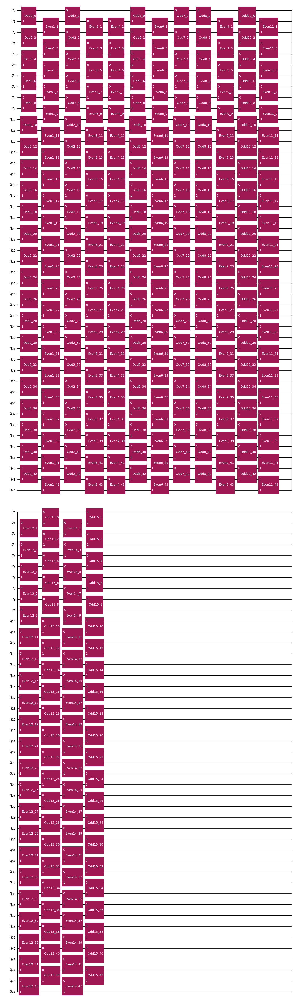

In [ ]:
from ropt_aqc.circuit_building import transform_to_bw_qc_unitarygate
gates_optimised = gates_optimised.reshape((len(gates_optimised), 4, 4))

qc_optimised = transform_to_bw_qc_unitarygate(num_sites, num_steps, system=system, gates=gates_optimised)
qc_optimised.draw('mpl')

# Hybrid Unitary method

Riemannian opt + AQC unitary

In [ ]:
method = 'hybrid-unitary'

In [ ]:
# set up quimb
from functools import partial
import quimb.tensor
from qiskit_addon_aqc_tensor.simulation.quimb import QuimbSimulator

simulator_settings = QuimbSimulator(
    partial(quimb.tensor.Circuit, gate_contract="split-gate"),
    autodiff_backend="jax",
)

In [ ]:
from ropt_aqc.pxp_model import pxp_hamiltonian_sparse

pxp_hamiltonian = pxp_hamiltonian_sparse(num_sites)

In [ ]:
from ropt_aqc.pxp_model import generate_reference_mpo

aqc_target_log2_num_trotter_steps = 8
aqc_target_mpo, aqc_target_step_circuit, _ = generate_reference_mpo(final_time, aqc_target_log2_num_trotter_steps, pxp_hamiltonian)

This single Trotter step circuit will be repeated 256 times:


KeyboardInterrupt: 

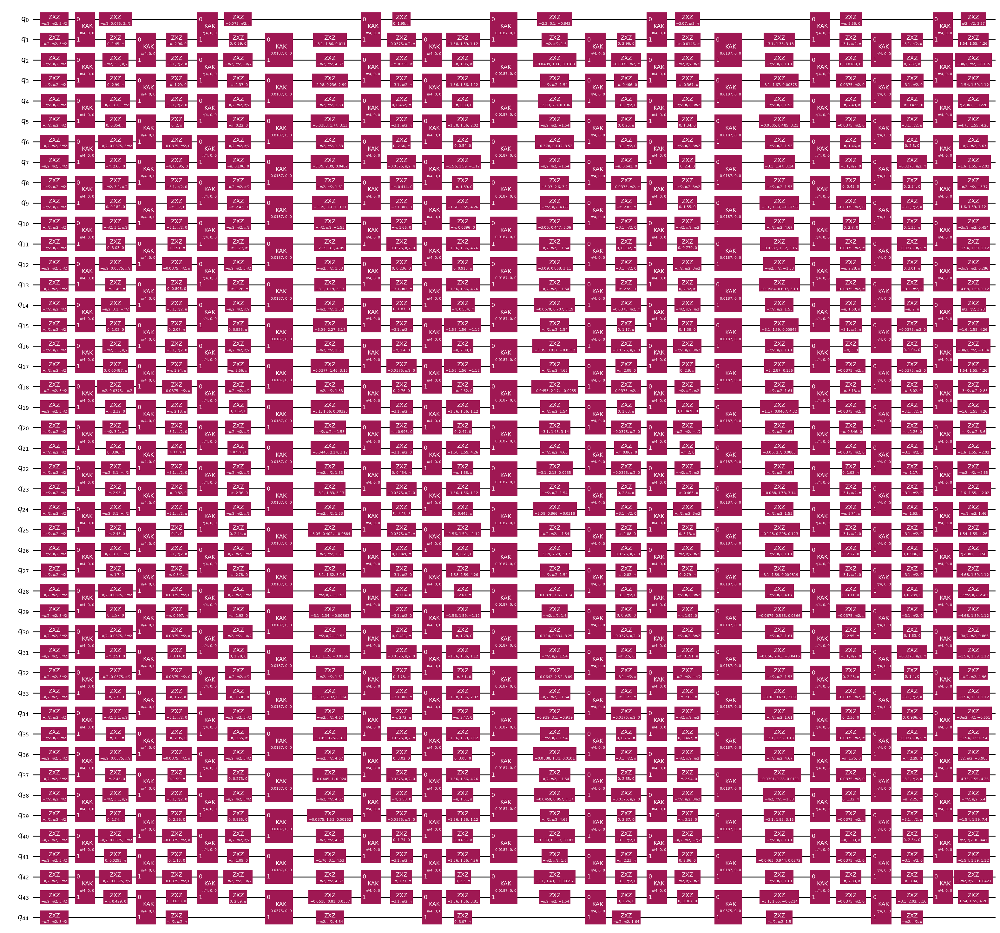

In [ ]:
# generate ansatz from circuit
from qiskit_addon_aqc_tensor import generate_ansatz_from_circuit

aqc_ansatz, aqc_initial_parameters = generate_ansatz_from_circuit(
    qc_optimised, parameter_name="x"
)
aqc_ansatz_original = aqc_ansatz.assign_parameters(aqc_initial_parameters)
aqc_ansatz_original.draw("mpl", fold=-1)
# aqc_ansatz_original.draw("mpl").savefig('Figures/initial_circuit_AQC-u_PXP_1step.pdf')

In [ ]:
aqc_depth = aqc_ansatz_original.depth()

# Complete optimisation of ansatz

In [ ]:
# Optimise with respect to fidelity
from scipy.optimize import OptimizeResult, minimize

from qiskit_addon_aqc_tensor.objective import MaximizeUnitaryFidelity

objective = MaximizeUnitaryFidelity(aqc_target_mpo, aqc_ansatz, simulator_settings)

stopping_point = 1e-5


def my_loss_function(*args):
    val, grad = objective.loss_function(*args)

    # Ensure val is a float (not quimb.Tensor or jax.Array)
    val = float(val) if hasattr(val, "item") else val
    grad = jnp.asarray(grad)

    print(f"Evaluating loss function: {1 - val:.8}")
    return val, grad



def callback(intermediate_result: OptimizeResult):
    print(f"Intermediate result: Fidelity {1 - intermediate_result.fun:.8}")
    if intermediate_result.fun < stopping_point:
        # Good enough for now
        raise StopIteration


result = minimize(
    my_loss_function,
    aqc_initial_parameters,
    method="L-BFGS-B",
    jac=True,
    options={"maxiter": 1000},
    callback=callback,
)
if result.status not in (
    0,
    1,
    99,
):  # 0 => success; 1 => max iterations reached; 99 => early termination via StopIteration
    raise RuntimeError(f"Optimization failed: {result.message} (status={result.status})")

print(f"Done after {result.nit} iterations.")
aqc_final_parameters = result.x

KeyboardInterrupt: 

=== Complete Optimised Circuit ===


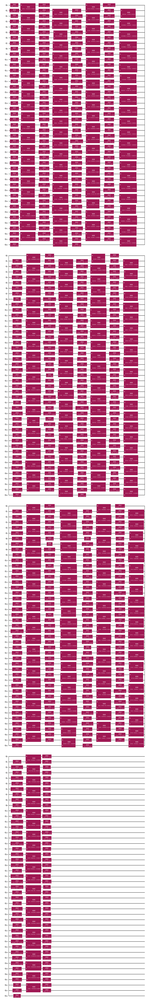

In [ ]:
# optimised circuit 
aqc_optimised_block = aqc_ansatz.assign_parameters(aqc_final_parameters)
print("=== Complete Optimised Circuit ===")
aqc_optimised_block.draw("mpl")

In [ ]:
optimised_aqc_depth = aqc_optimised_block.depth()
print(optimised_aqc_depth)

27


In [ ]:
from ropt_aqc.pxp_model import convert_qiskit_layers_to_gate_tensors

layered_gates_optimised = convert_qiskit_layers_to_gate_tensors(aqc_optimised_block)
state_optimised = test_magnetisation_qiskit(num_sites, binary, time_steps, layered_gates_optimised)

NameError: name 'test_magnetisation_qiskit' is not defined

In [ ]:
from ropt_aqc.pxp_model import calcualte_initial_final_Frobenius

initial_fidelity, final_fidelity = calcualte_initial_final_Frobenius(num_sites, aqc_target_step_circuit, aqc_target_log2_num_trotter_steps, aqc_optimised_block, initial_qc=remapped_circuit)

# Forward Optimisation of Ansatz

In [ ]:
from ropt_aqc.comparison_methods import compress_HS_AQC_unitary

N_vals = range(1, aqc_depth+1)
df, aqc_ansatz, aqc_initial_parameters, aqc_final_parameters = compress_HS_AQC_unitary(gates_optimised, config, simulator_settings, aqc_target_mpo, N_vals)


=== Optimizing with N = 1 native layers ===
Evaluating fidelity: 0.00000018
Intermediate result: Fidelity 1.752749e-07
Evaluating fidelity: 0.00000018
Intermediate result: Fidelity 1.7862694e-07
Evaluating fidelity: 0.00000018
Intermediate result: Fidelity 1.8204033e-07
Evaluating fidelity: 0.00000019
Intermediate result: Fidelity 1.8551719e-07
Evaluating fidelity: 0.00000019
Intermediate result: Fidelity 1.890597e-07
Evaluating fidelity: 0.00000019
Intermediate result: Fidelity 1.9267017e-07
Evaluating fidelity: 0.00000020
Intermediate result: Fidelity 1.9635099e-07
Evaluating fidelity: 0.00000020
Intermediate result: Fidelity 2.0010466e-07
Evaluating fidelity: 0.00000020
Intermediate result: Fidelity 2.0393378e-07
Evaluating fidelity: 0.00000021
Intermediate result: Fidelity 2.0784108e-07
Evaluating fidelity: 0.00000021
Intermediate result: Fidelity 2.1182939e-07
Evaluating fidelity: 0.00000022
Intermediate result: Fidelity 2.1590167e-07
Evaluating fidelity: 0.00000022
Intermediate 

In [ ]:
import pandas as pd
file_path_PXP_hybrid = f'/Users/aag/Documents/ropt-aqc/PXP/results/Hybrid_unitary_PXP_results_{num_sites}q_{final_time}_{num_steps}steps.csv'
# df.to_csv(file_path_PXP_hybrid, index=False, header=True)
# df.to_csv(file_path_PXP, index=False, mode="a", header=False)

FileNotFoundError: [Errno 2] No such file or directory: '/home/b/aag/ropt-aqc/production/Figures/hybrid-unitary_0.1_pxp_infidelity.pdf'

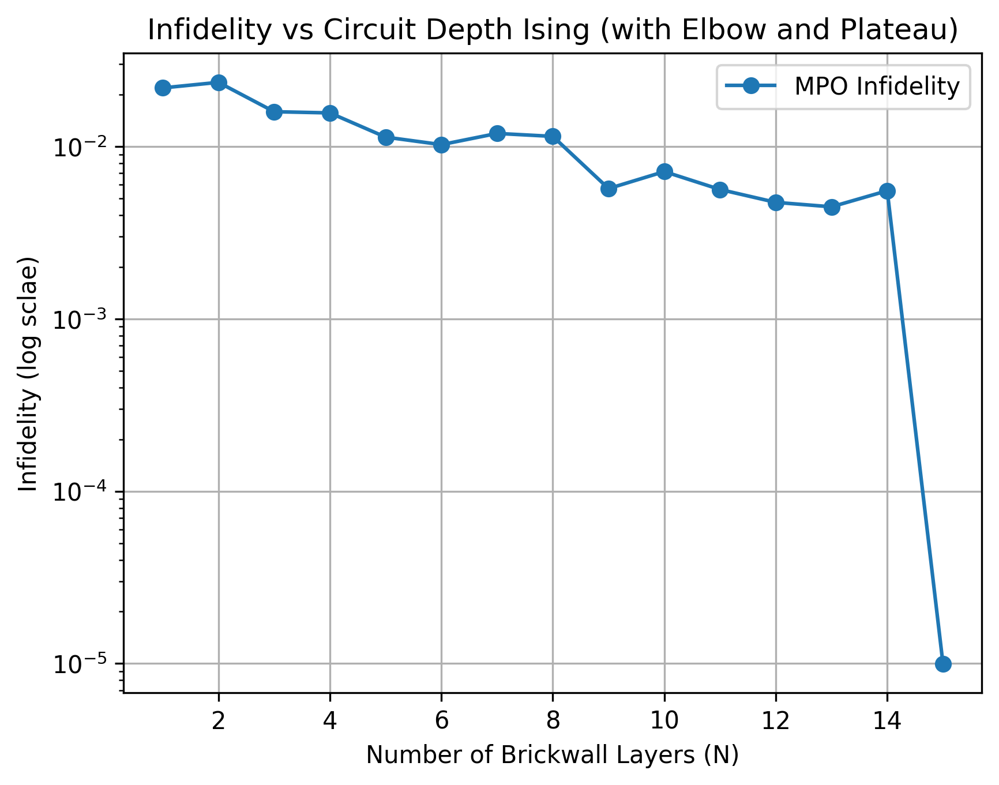

In [ ]:
from ropt_aqc.brickwall_opt import plot_fidelity

df =pd.read_csv(file_path_PXP_hybrid)
elbow_N, plateau_N = plot_fidelity(df, 'Final_fidelity', final_time, 1e-3, method, system, save_path=True)

In [ ]:
# Compress circuit
from ropt_aqc.comparison_methods import compress_HS_AQC_unitary

# N_vals = [int(plateau_N)]
N_vals = [3]
df_compressed, aqc_ansatz_compressed, aqc_initial_parameters_compressed, aqc_final_parameters_compressed = compress_HS_AQC_unitary(gates_optimised, config, simulator_settings, aqc_target_mpo, N_vals)


=== Optimizing with N = 3 native layers ===
Evaluating fidelity: 0.00000071
Intermediate result: Fidelity 7.0949445e-07
Evaluating fidelity: 0.00000075
Intermediate result: Fidelity 7.508862e-07
Evaluating fidelity: 0.00000079
Intermediate result: Fidelity 7.9448586e-07
Evaluating fidelity: 0.00000084
Intermediate result: Fidelity 8.4042994e-07
Evaluating fidelity: 0.00000089
Intermediate result: Fidelity 8.8886529e-07
Evaluating fidelity: 0.00000094
Intermediate result: Fidelity 9.3994989e-07
Evaluating fidelity: 0.00000099
Intermediate result: Fidelity 9.938536e-07
Evaluating fidelity: 0.00000105
Intermediate result: Fidelity 1.050759e-06
Evaluating fidelity: 0.00000111
Intermediate result: Fidelity 1.1108623e-06
Evaluating fidelity: 0.00000117
Intermediate result: Fidelity 1.1743741e-06
Evaluating fidelity: 0.00000124
Intermediate result: Fidelity 1.2415209e-06
Evaluating fidelity: 0.00000131
Intermediate result: Fidelity 1.3125454e-06
Evaluating fidelity: 0.00000139
Intermediate r

=== Compressed Optimised Circuit ===
3


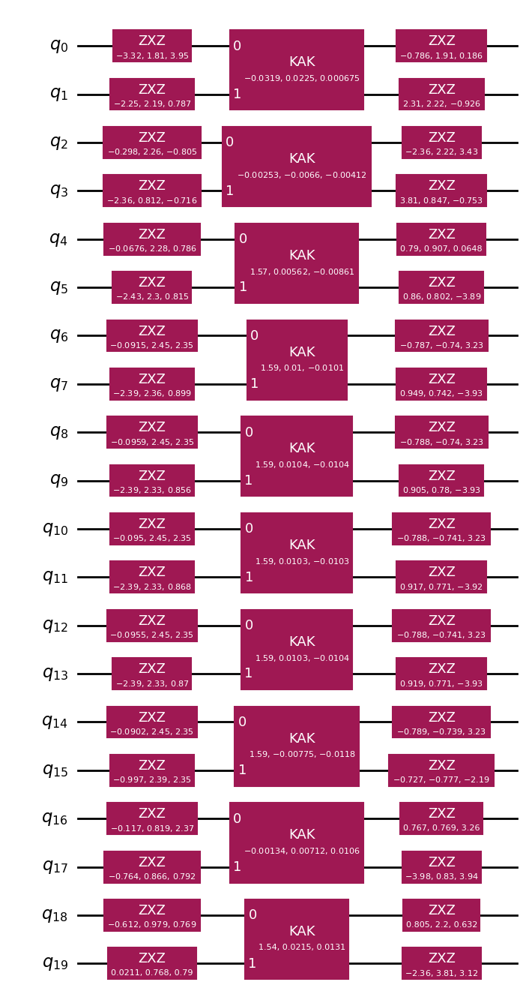

In [ ]:
print("=== Compressed Optimised Circuit ===")
print(aqc_ansatz_compressed.depth())
param_binding = {param: value for param, value in zip(aqc_ansatz_compressed.parameters, aqc_final_parameters_compressed)}
aqc_optimised_compressed = aqc_ansatz_compressed.assign_parameters(param_binding)

aqc_optimised_compressed.draw("mpl")
# aqc_optimised_compressed.draw("mpl").savefig('optimised_circuit_hybrid-AQC-u_PXP.pdf')
# print(aqc_optimised_compressed.depth())

In [ ]:
print("\n=== Compressed Optimised Parameters ===")
import pandas as pd
for param, value in zip(aqc_ansatz_compressed.parameters, aqc_final_parameters_compressed):
    print(f"{param}: {value:.6f}")

df_params = pd.DataFrame({'parameters': aqc_final_parameters_compressed})
df_params.to_csv('aqc_unitary_parameters_Ising.csv', index=False)


=== Compressed Optimised Parameters ===
theta[0]: -3.322929
theta[1]: 1.811413
theta[2]: 3.947227
theta[3]: -2.245020
theta[4]: 2.192698
theta[5]: 0.787017
theta[6]: -0.298484
theta[7]: 2.262989
theta[8]: -0.804673
theta[9]: -2.356313
theta[10]: 0.811510
theta[11]: -0.716305
theta[12]: -0.067563
theta[13]: 2.284613
theta[14]: 0.786037
theta[15]: -2.428044
theta[16]: 2.302185
theta[17]: 0.814908
theta[18]: -0.091482
theta[19]: 2.450909
theta[20]: 2.347848
theta[21]: -2.393351
theta[22]: 2.363809
theta[23]: 0.899000
theta[24]: -0.095945
theta[25]: 2.450939
theta[26]: 2.346481
theta[27]: -2.391961
theta[28]: 2.325952
theta[29]: 0.856127
theta[30]: -0.095000
theta[31]: 2.450886
theta[32]: 2.346910
theta[33]: -2.393809
theta[34]: 2.334670
theta[35]: 0.868389
theta[36]: -0.095523
theta[37]: 2.450800
theta[38]: 2.346518
theta[39]: -2.390650
theta[40]: 2.334767
theta[41]: 0.870094
theta[42]: -0.090220
theta[43]: 2.452310
theta[44]: 2.346374
theta[45]: -0.997001
theta[46]: 2.392705
theta[47]: 

3
16


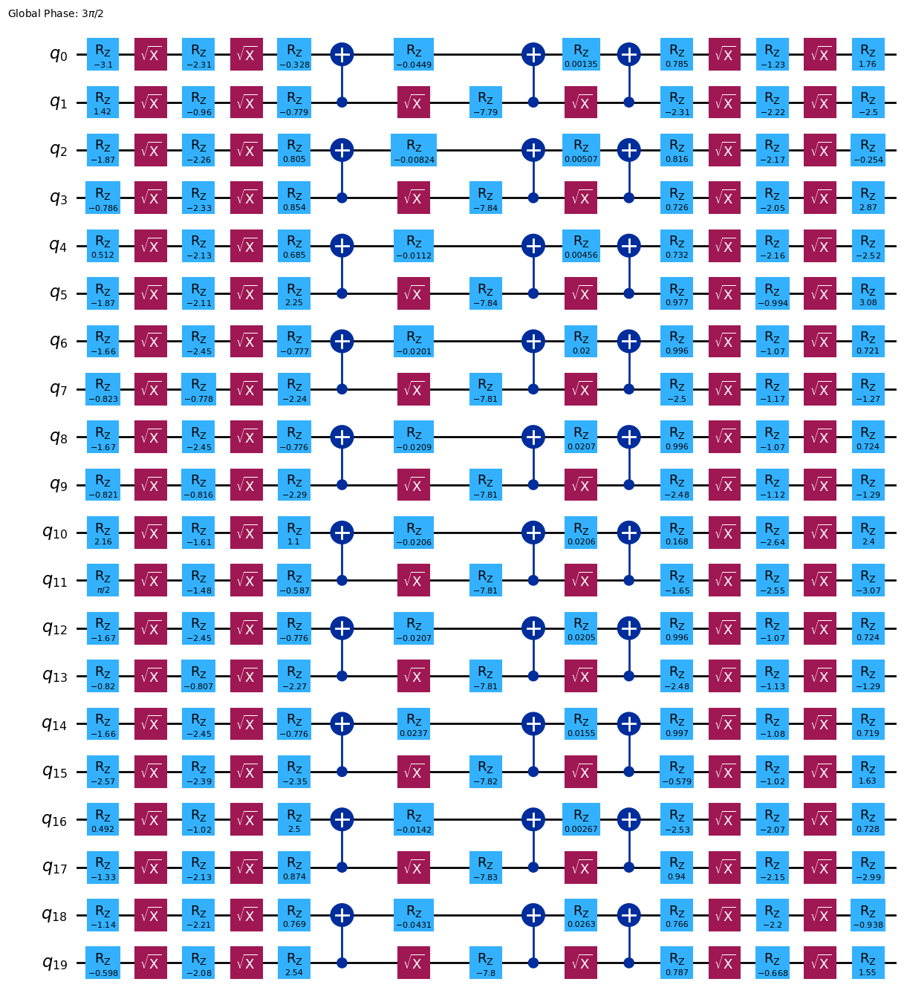

In [ ]:
from qiskit import transpile

print(aqc_ansatz_compressed.depth())
transpiled_circuit_aqc_comp = transpile(aqc_optimised_compressed, basis_gates=['cx', 'rz', 'sx'], optimization_level=3)
print(transpiled_circuit_aqc_comp.depth())
transpiled_circuit_aqc_comp.draw('mpl')

In [ ]:
print(f"Number of parameters in ansatz: {len(aqc_ansatz_compressed.parameters)}")
print(f"Physical depth of compressed circuit: {aqc_optimised_compressed.depth()}")
print(f"Transpiled depth of compressed circuit: {transpiled_circuit_aqc_comp.depth()}")
print(f"Physical depth of original circuit: {remapped_circuit_merged.depth()}")
print(f"Transpiled depth of original circuit: {transpiled_circuit.depth()}")
print(f"Compression ratio: {aqc_depth / aqc_optimised_compressed.depth()}")
print(f"Transpiled Compression ratio: {transpiled_circuit.depth() / transpiled_circuit_aqc_comp.depth()}")

Number of parameters in ansatz: 150
Physical depth of compressed circuit: 3
Transpiled depth of compressed circuit: 16
Physical depth of original circuit: 8
Transpiled depth of original circuit: 45
Compression ratio: 5.0
Transpiled Compression ratio: 2.8125


In [ ]:
layered_gates_compressed = convert_qiskit_layers_to_gate_tensors(aqc_optimised_compressed)
state_compressed = test_magnetisation_qiskit(num_sites, binary, time_steps, layered_gates_compressed)

NameError: name 'convert_qiskit_layers_to_gate_tensors' is not defined

# Reverse Compression Ansatz

In [ ]:
from ropt_aqc.comparison_methods import compress_HS_AQC_unitary_reverse

df, aqc_truncated, aqc_final_parameters_reverse = compress_HS_AQC_unitary_reverse(gates_optimised, config, simulator_settings, aqc_depth, aqc_target_mpo, fidelity_threshold=0.98)


=== Optimizing with N = 39 native layers ===
N = 39 → Truncated circuit has 1689 parameters
Evaluating fidelity: 0.00325192
Intermediate result: Fidelity 0.0032519205
Evaluating fidelity: 0.00410383
Intermediate result: Fidelity 0.0041038327
Evaluating fidelity: 0.00510369
Intermediate result: Fidelity 0.0051036926
Evaluating fidelity: 0.00626379
Intermediate result: Fidelity 0.0062637945
Evaluating fidelity: 0.00759601
Intermediate result: Fidelity 0.0075960108
Evaluating fidelity: 0.00911222
Intermediate result: Fidelity 0.0091122241
Evaluating fidelity: 0.01082506
Intermediate result: Fidelity 0.010825056
Evaluating fidelity: 0.01274819
Intermediate result: Fidelity 0.012748192
Evaluating fidelity: 0.01489628
Intermediate result: Fidelity 0.014896283
Evaluating fidelity: 0.01728514
Intermediate result: Fidelity 0.017285137
Evaluating fidelity: 0.01993162
Intermediate result: Fidelity 0.019931622
Evaluating fidelity: 0.02285297
Intermediate result: Fidelity 0.022852967
Evaluating fi

In [ ]:
from qiskit import transpile

print(aqc_truncated.depth())
transpiled_circuit_aqc = transpile(aqc_truncated, basis_gates=['cx', 'rz', 'sx'], optimization_level=3)
print(transpiled_circuit_aqc.depth())

8
70


In [ ]:
from ropt_aqc.comparison_methods import compress_AQC_unitary_reverse

df, aqc_truncated, aqc_final_parameters_reverse = compress_AQC_unitary_reverse(aqc_ansatz, aqc_initial_parameters, aqc_depth, aqc_target_mpo, simulator_settings, fidelity_threshold=0.97)


=== Reverse Compression: Optimising with N = 15 layers ===
N = 15 → Truncated circuit has 663 parameters
[Instruction(name='zxz', num_qubits=1, num_clbits=0, params=[ParameterVectorElement(x[0]), ParameterVectorElement(x[1]), ParameterVectorElement(x[2])]), Instruction(name='zxz', num_qubits=1, num_clbits=0, params=[ParameterVectorElement(x[3]), ParameterVectorElement(x[4]), ParameterVectorElement(x[5])]), Instruction(name='zxz', num_qubits=1, num_clbits=0, params=[ParameterVectorElement(x[6]), ParameterVectorElement(x[7]), ParameterVectorElement(x[8])]), Instruction(name='zxz', num_qubits=1, num_clbits=0, params=[ParameterVectorElement(x[9]), ParameterVectorElement(x[10]), ParameterVectorElement(x[11])]), Instruction(name='zxz', num_qubits=1, num_clbits=0, params=[ParameterVectorElement(x[12]), ParameterVectorElement(x[13]), ParameterVectorElement(x[14])]), Instruction(name='zxz', num_qubits=1, num_clbits=0, params=[ParameterVectorElement(x[15]), ParameterVectorElement(x[16]), Parame

In [ ]:
from qiskit import transpile

print(aqc_truncated.depth())
transpiled_circuit_aqc = transpile(aqc_truncated, basis_gates=['cx', 'rz', 'sx'], optimization_level=3)
print(transpiled_circuit_aqc.depth())

4
36


In [ ]:
import pandas as pd
file_path_PXP_hybrid=f'/Users/aag/Documents/ropt-aqc/PXP/results/Hybrid_unitary_PXP_results_{num_sites}q_{final_time}_{num_steps}steps_reverse.csv'
df.to_csv(file_path_PXP_hybrid, index=False, header=True)
# df.to_csv(file_path_PXP, index=False, mode="a", header=False)

In [ ]:
from ropt_aqc.brickwall_opt import plot_fidelity
# df_reverse = df.sort_values("circuit_layers", ascending=True)
df =pd.read_csv(file_path_PXP_hybrid)
elbow_N, plateau_N = plot_fidelity(df, 'Final_fidelity', final_time, 1e-3, method, system, save_path=True)

=== Complete Optimised Circuit ===


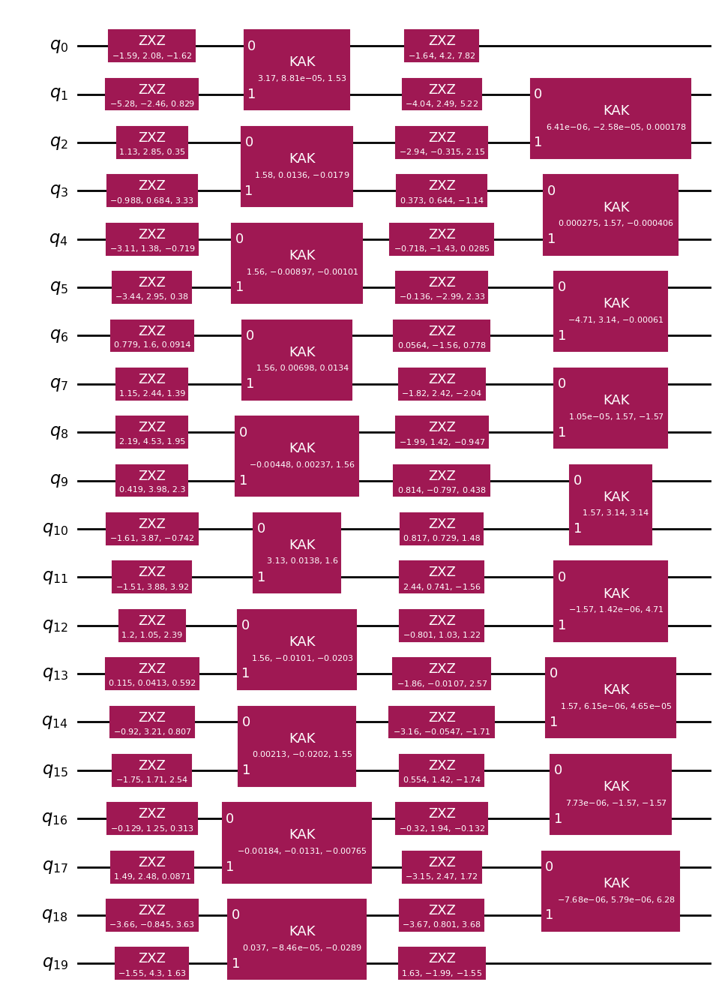

In [ ]:
print("=== Compressed Optimised Circuit ===")

param_binding = {param: value for param, value in zip(aqc_truncated.parameters, aqc_final_parameters_reverse)}
aqc_optimised_compressed = aqc_truncated.assign_parameters(param_binding)

aqc_optimised_compressed.draw("mpl")
# aqc_optimised_compressed.draw("mpl").savefig('Figures/optimised_circuit_AQC-u_PXP.pdf')

In [ ]:
print(aqc_optimised_compressed.depth())
transpiled_circuit_aqc = transpile(aqc_optimised_compressed, basis_gates=['cx', 'rz', 'sx'], optimization_level=3)
print(transpiled_circuit_aqc.depth())

In [ ]:
from ropt_aqc.pxp_model import calcualte_initial_final_Frobenius

initial_fidelity, final_fidelity = calcualte_initial_final_Frobenius(num_sites, aqc_target_step_circuit, aqc_target_log2_num_trotter_steps, aqc_optimised_block, initial_qc=qc_optimised)

UnboundLocalError: cannot access local variable 'final_fidelity' where it is not associated with a value

=== Compressed Optimised Circuit ===
3


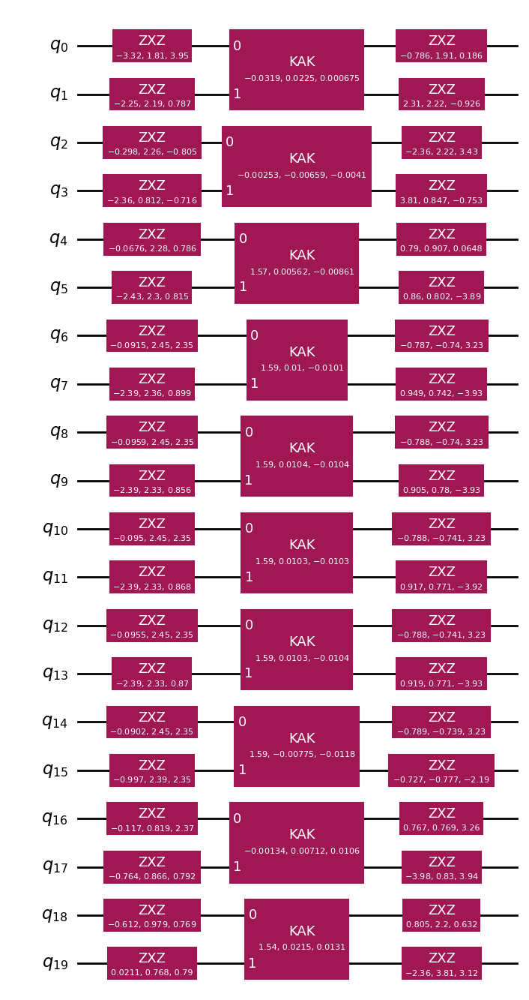

In [ ]:
print("\n=== Compressed Optimised Parameters ===")
import pandas as pd
for param, value in zip(aqc_truncated.parameters, aqc_final_parameters_reverse):
    print(f"{param}: {value:.6f}")

df_params = pd.DataFrame({'parameters': aqc_final_parameters_compressed})
df_params.to_csv('aqc_unitary_parameters_Ising.csv', index=False)

In [ ]:
print(f"Number of parameters in ansatz: {len(aqc_truncated.parameters)}")
print(f"Physical depth of compressed circuit: {aqc_optimised_compressed.depth()}")
print(f"Transpiled depth of compressed circuit: {transpiled_circuit_aqc.depth()}")
print(f"Compression ratio: {aqc_depth / aqc_optimised_compressed.depth()}")
print(f"Transpiled Compression ratio: {transpiled_circuit.depth() / transpiled_circuit_aqc.depth()}")

Number of parameters in ansatz: 150
Physical depth of compressed circuit: 3
Transpiled depth of compressed circuit: 16
Compression ratio: 5.0
Transpiled Compression ratio: 2.8125


  0%|          | 0/20 [00:00<?, ?it/s]

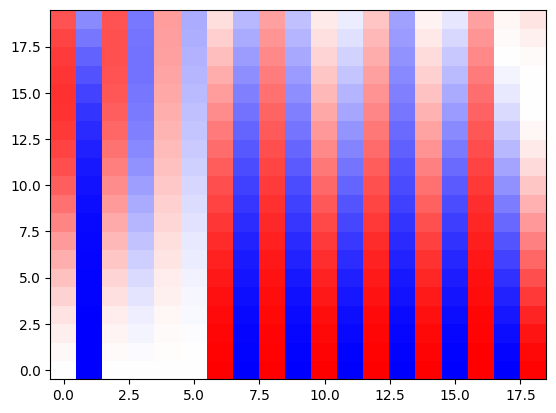

In [ ]:
from ropt_aqc.pxp_model import convert_qiskit_layers_to_gate_tensors

layered_gates_compressed = convert_qiskit_layers_to_gate_tensors(aqc_optimised_compressed)
state_compressed = test_magnetisation_qiskit(num_sites, binary, time_steps, layered_gates_compressed)